#Intro
In this notebook We will explore and perform EDA on the FD003 file. 

|Dataset	|Operating conditions |	Fault modes|	Train size (nr. of engines)	| Test size (nr. of engines)|
|--------|---|---|-----|-----|
| FD003	| 1	| 2	| 100	| 100 |

In [1]:
#%pip install missingno

In [1]:
import seaborn as sns
import os
import pandas as pd
import numpy as np
np.random.seed(1337)
from IPython.display import Image
import matplotlib as mpl
import matplotlib.pyplot as plt
from pandas import read_csv
from matplotlib import pyplot as plt
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler

import missingno as msno

In [2]:
#%pip install missingno

In [3]:
# settings will be used to avoid exponential values in output or tables and to display 50 rows maximum

pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.options.display.max_rows=50

In [4]:
# Replace 'file.txt' with the name of your .txt file
train = pd.read_csv('nasa/train_FD003.txt', delimiter=' ')

# Print the first few rows of the DataFrame
print(train.head())
print(train.shape)
print(list(train.columns))

   1  1.1  -0.0005  0.0004   100.0  518.67  642.36  1583.23  1396.84  14.62  \
0  1    2    0.001  -0.000 100.000 518.670 642.500 1584.690 1396.890 14.620   
1  1    3   -0.001  -0.000 100.000 518.670 642.180 1582.350 1405.610 14.620   
2  1    4   -0.002   0.000 100.000 518.670 642.920 1585.610 1392.270 14.620   
3  1    5    0.002   0.000 100.000 518.670 641.680 1588.630 1397.650 14.620   
4  1    6    0.001  -0.001 100.000 518.670 642.240 1584.090 1400.010 14.620   

   ...  8145.32  8.4246  0.03  391  2388  100.00  39.11  23.3537  Unnamed: 26  \
0  ... 8152.850   8.440 0.030  392  2388 100.000 38.990   23.449          NaN   
1  ... 8150.170   8.390 0.030  391  2388 100.000 38.850   23.367          NaN   
2  ... 8146.560   8.388 0.030  392  2388 100.000 38.960   23.295          NaN   
3  ... 8147.800   8.387 0.030  392  2388 100.000 39.140   23.458          NaN   
4  ... 8144.920   8.415 0.030  393  2388 100.000 38.920   23.428          NaN   

   Unnamed: 27  
0          NaN  
1   

In [6]:
# Rename columns
new_col_names = ['unit', 'time', 'op1', 'op2', 'op3', 'sm1', 'sm2', 'sm3', 'sm4', 'sm5', 'sm6', 'sm7', 'sm8', 'sm9', 'sm10', 'sm11', 'sm12', 'sm13', 'sm14', 'sm15', 'sm16', 'sm17', 'sm18', 'sm19', 'sm20', 'sm21', 'HPC', 'FAN']
train = train.rename(columns={train.columns[i]: new_col_names[i] for i in range(len(train.columns))})

## Check for Missing data

<Axes: >

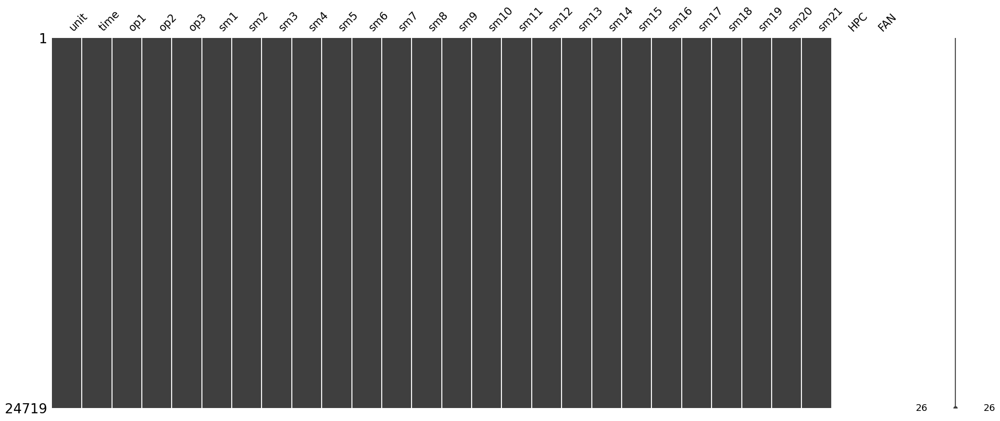

In [7]:
msno.matrix(train)

In [8]:
train.head(5)

,unit,time,op1,op2,op3,sm1,sm2,sm3,sm4,sm5,...,sm14,sm15,sm16,sm17,sm18,sm19,sm20,sm21,HPC,FAN
0,1,2,0.001,-0.000,100.000,518.670,642.500,1584.690,1396.890,14.620,...,8152.850,8.440,0.030,392,2388,100.000,38.990,23.449,NaN,NaN
1,1,3,-0.001,-0.000,100.000,518.670,642.180,1582.350,1405.610,14.620,...,8150.170,8.390,0.030,391,2388,100.000,38.850,23.367,NaN,NaN
2,1,4,-0.002,0.000,100.000,518.670,642.920,1585.610,1392.270,14.620,...,8146.560,8.388,0.030,392,2388,100.000,38.960,23.295,NaN,NaN
3,1,5,0.002,0.000,100.000,518.670,641.680,1588.630,1397.650,14.620,...,8147.800,8.387,0.030,392,2388,100.000,39.140,23.458,NaN,NaN
4,1,6,0.001,-0.001,100.000,518.670,642.240,1584.090,1400.010,14.620,...,8144.920,8.415,0.030,393,2388,100.000,38.920,23.428,NaN,NaN


In [9]:
train.tail(5)

,unit,time,op1,op2,op3,sm1,sm2,sm3,sm4,sm5,...,sm14,sm15,sm16,sm17,sm18,sm19,sm20,sm21,HPC,FAN
24714,100,148,-0.002,-0.000,100.000,518.670,643.780,1596.010,1424.110,14.620,...,8138.080,8.504,0.030,394,2388,100.000,38.440,22.963,NaN,NaN
24715,100,149,0.003,-0.000,100.000,518.670,643.290,1596.380,1429.140,14.620,...,8144.360,8.517,0.030,395,2388,100.000,38.500,22.975,NaN,NaN
24716,100,150,-0.002,0.000,100.000,518.670,643.840,1604.530,1431.410,14.620,...,8135.950,8.522,0.030,396,2388,100.000,38.390,23.068,NaN,NaN
24717,100,151,-0.002,0.000,100.000,518.670,643.940,1597.560,1426.570,14.620,...,8141.240,8.515,0.030,395,2388,100.000,38.310,23.075,NaN,NaN
24718,100,152,0.000,0.000,100.000,518.670,643.640,1599.040,1436.060,14.620,...,8136.980,8.515,0.030,396,2388,100.000,38.560,23.085,NaN,NaN


## Looking at the general distribution of the sensor measures and operating modes

In [10]:
train.describe()

,unit,time,op1,op2,op3,sm1,sm2,sm3,sm4,sm5,...,sm14,sm15,sm16,sm17,sm18,sm19,sm20,sm21,HPC,FAN
count,24719.000,24719.000,24719.000,24719.000,24719.000,24719.000,24719.000,24719.000,24719.000,24719.000,...,24719.000,24719.000,24719.000,24719.000,24719.000,24719.000,24719.000,24719.000,0.000,0.000
mean,48.634,139.083,-0.000,0.000,100.000,518.670,642.458,1588.079,1404.472,14.620,...,8144.203,8.396,0.030,392.567,2388.000,100.000,38.989,23.393,NaN,NaN
std,29.348,98.845,0.002,0.000,0.000,0.000,0.523,6.810,9.773,0.000,...,16.504,0.061,0.000,1.761,0.000,0.000,0.249,0.149,NaN,NaN
min,1.000,1.000,-0.009,-0.001,100.000,518.670,640.840,1564.300,1377.060,14.620,...,8099.680,8.156,0.030,388.000,2388.000,100.000,38.170,22.873,NaN,NaN
25%,23.000,62.000,-0.002,-0.000,100.000,518.670,642.080,1583.280,1397.190,14.620,...,8134.510,8.361,0.030,391.000,2388.000,100.000,38.830,23.296,NaN,NaN
50%,47.000,124.000,0.000,0.000,100.000,518.670,642.400,1587.520,1402.910,14.620,...,8141.200,8.398,0.030,392.000,2388.000,100.000,38.990,23.392,NaN,NaN
75%,74.000,191.000,0.002,0.000,100.000,518.670,642.790,1592.415,1410.600,14.620,...,8149.230,8.437,0.030,394.000,2388.000,100.000,39.140,23.483,NaN,NaN
max,100.000,525.000,0.009,0.001,100.000,518.670,645.110,1615.390,1441.160,14.620,...,8290.550,8.570,0.030,399.000,2388.000,100.000,39.850,23.951,NaN,NaN


<Axes: xlabel='unit'>

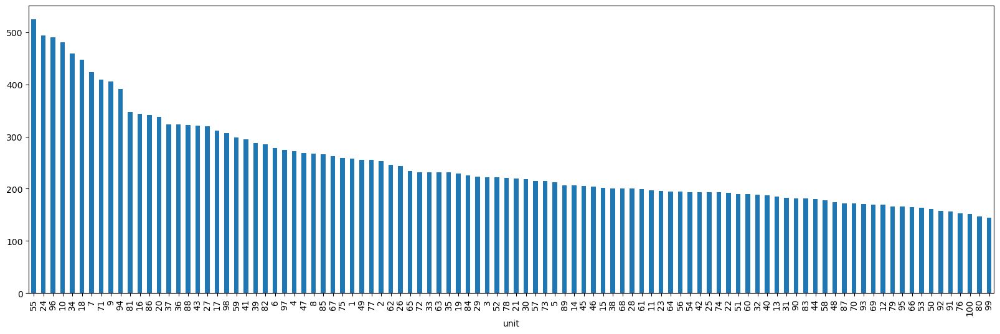

In [11]:
plt.figure(figsize=(20,6))
train.unit.value_counts().plot.bar() # for each unit.. how many


### Lets look at the sensor data for unit 1

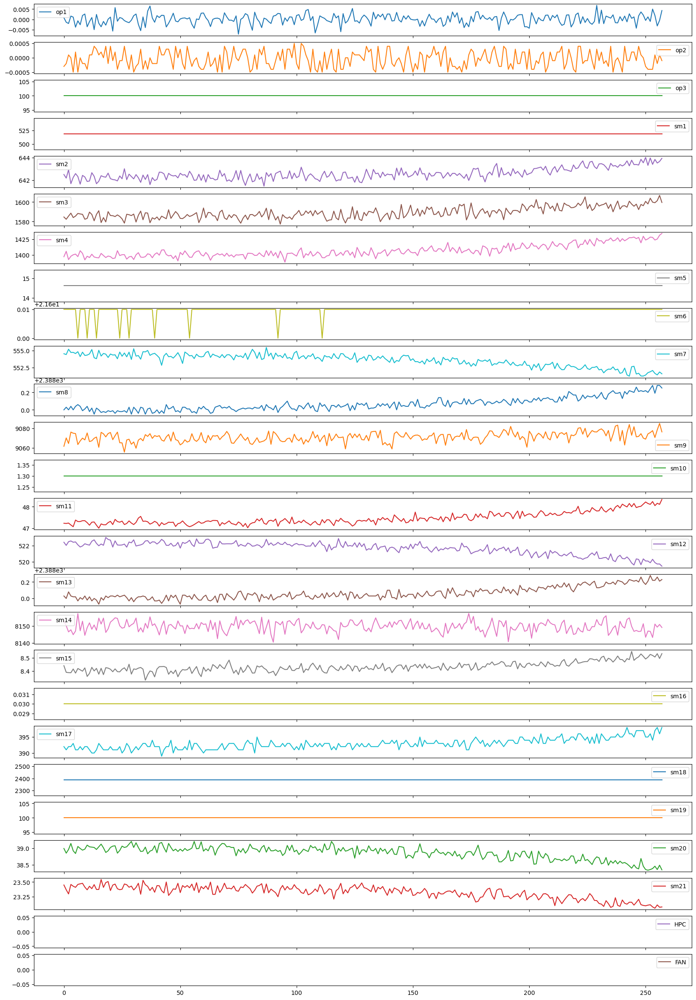

In [12]:
### plotting sensor data for engine ID  - Unit 1
engine_unit = train[train['unit'] == 1]

ax1 = engine_unit[train.columns[2:]].plot(subplots=True, figsize=(20,30))

In [13]:

### CALCULATE RUL TRAIN ###
train['RUL']=train.groupby(['unit'])['time'].transform(max)-train['time']
train.RUL[0:10]

0    257
1    256
2    255
3    254
4    253
5    252
6    251
7    250
8    249
9    248
Name: RUL, dtype: int64

In [14]:
### ADD NEW LABEL TRAIN ###
w1 = 45
w0 = 15
train['label1'] = np.where(train['RUL'] <= w1, 1, 0 )
train['label2'] = train['label1']
train.loc[train['RUL'] <= w0, 'label2'] = 2

In [15]:
train_OG = train.copy()

### SCALE TRAIN DATA ###

def scale(df):
    return (df - df.mean())/df.std()
    return (df - df.min())/(df.max()-df.min())

for col in train.columns:
    if col[0] == 's':
        train[col] = scale(train[col])
    elif col == 'time':
        train['cycle_norm'] = scale(train[col])
        
train = train.dropna(axis=1)
train.head()

,unit,time,op1,op2,op3,sm1,sm2,sm3,sm4,sm5,...,sm14,sm15,sm16,sm17,sm20,sm21,RUL,label1,label2,cycle_norm
0,1,2,0.001,-0.000,100.000,0.000,0.081,-0.498,-0.776,-0.000,...,0.524,0.729,-0.001,-0.322,0.006,0.376,257,0,0,-1.387
1,1,3,-0.001,-0.000,100.000,0.000,-0.531,-0.841,0.116,-0.000,...,0.362,-0.100,-0.001,-0.889,-0.557,-0.175,256,0,0,-1.377
2,1,4,-0.002,0.000,100.000,0.000,0.884,-0.363,-1.248,-0.000,...,0.143,-0.138,-0.001,-0.322,-0.115,-0.656,255,0,0,-1.367
3,1,5,0.002,0.000,100.000,0.000,-1.487,0.081,-0.698,-0.000,...,0.218,-0.153,-0.001,-0.322,0.609,0.437,254,0,0,-1.356
4,1,6,0.001,-0.001,100.000,0.000,-0.417,-0.586,-0.457,-0.000,...,0.043,0.314,-0.001,0.246,-0.275,0.235,253,0,0,-1.346


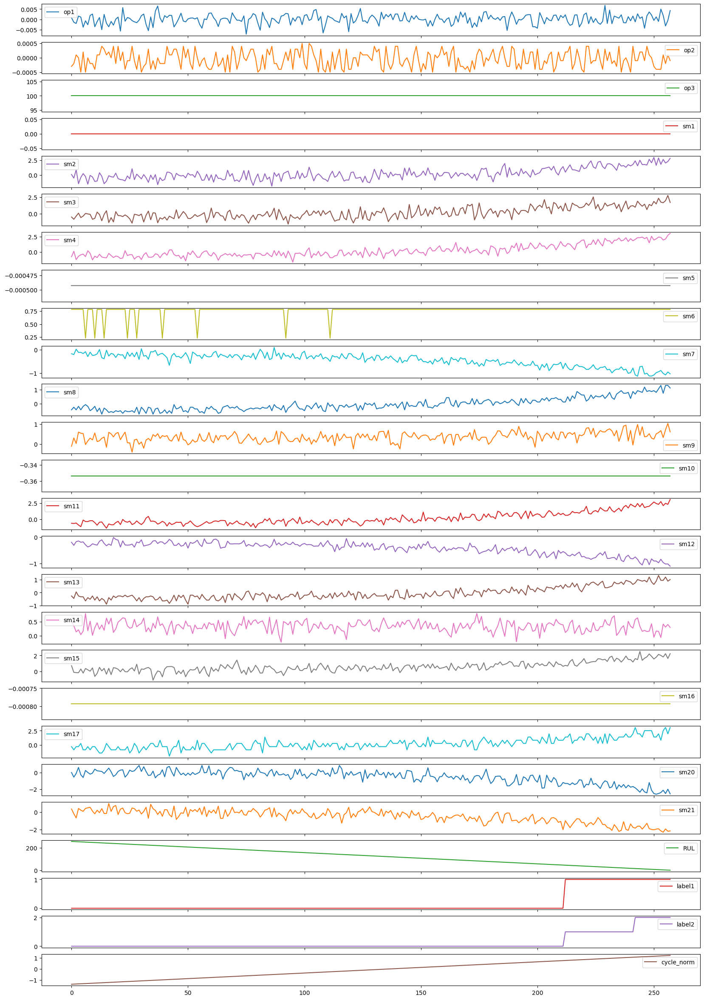

In [18]:
### plotting sensor data for engine ID  - Unit 1
engine_unit = train[train['unit'] == 1]

ax1 = engine_unit[train.columns[2:]].plot(subplots=True, figsize=(20,30))

### It looks like there a few variables with stagnant readings, lets remove these and continue the EDA

In [19]:
train.drop(['sm1', 'sm5', 'sm10', 'sm16', 
            'op3'], axis=1, inplace=True)

In [20]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24719 entries, 0 to 24718
Data columns (total 23 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   unit        24719 non-null  int64  
 1   time        24719 non-null  int64  
 2   op1         24719 non-null  float64
 3   op2         24719 non-null  float64
 4   sm2         24719 non-null  float64
 5   sm3         24719 non-null  float64
 6   sm4         24719 non-null  float64
 7   sm6         24719 non-null  float64
 8   sm7         24719 non-null  float64
 9   sm8         24719 non-null  float64
 10  sm9         24719 non-null  float64
 11  sm11        24719 non-null  float64
 12  sm12        24719 non-null  float64
 13  sm13        24719 non-null  float64
 14  sm14        24719 non-null  float64
 15  sm15        24719 non-null  float64
 16  sm17        24719 non-null  float64
 17  sm20        24719 non-null  float64
 18  sm21        24719 non-null  float64
 19  RUL         24719 non-nul

In [21]:
train.tail()

,unit,time,op1,op2,sm2,sm3,sm4,sm6,sm7,sm8,...,sm13,sm14,sm15,sm17,sm20,sm21,RUL,label1,label2,cycle_norm
24714,100,148,-0.002,-0.000,2.528,1.164,2.009,0.782,-0.955,1.127,...,1.444,-0.371,1.775,0.814,-2.204,-2.881,4,1,2,0.090
24715,100,149,0.003,-0.000,1.591,1.219,2.524,0.782,-0.955,1.001,...,1.318,0.010,2.003,1.381,-1.963,-2.804,3,1,2,0.100
24716,100,150,-0.002,0.000,2.643,2.415,2.756,0.782,-1.118,1.127,...,1.065,-0.500,2.084,1.949,-2.405,-2.177,2,1,2,0.110
24717,100,151,-0.002,0.000,2.834,1.392,2.261,0.782,-1.296,1.191,...,1.191,-0.180,1.960,1.381,-2.727,-2.129,1,1,2,0.121
24718,100,152,0.000,0.000,2.260,1.609,3.232,0.782,-1.217,1.191,...,1.065,-0.438,1.964,1.949,-1.722,-2.066,0,1,2,0.131


In [22]:
train.columns

Index(['unit', 'time', 'op1', 'op2', 'sm2', 'sm3', 'sm4', 'sm6', 'sm7', 'sm8',
       'sm9', 'sm11', 'sm12', 'sm13', 'sm14', 'sm15', 'sm17', 'sm20', 'sm21',
       'RUL', 'label1', 'label2', 'cycle_norm'],
      dtype='object')

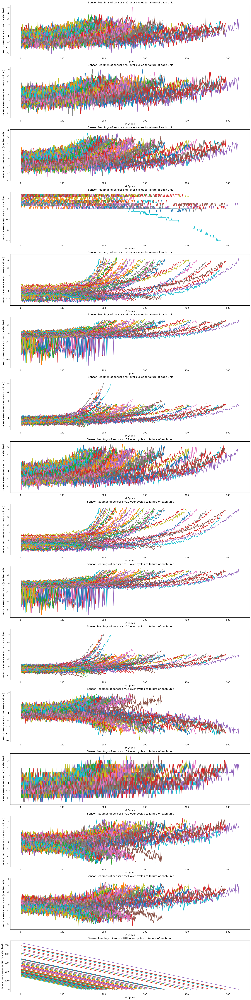

In [23]:

fig, axes = plt.subplots(nrows=16, ncols=1, figsize=(16,64), constrained_layout = True)

cols = train.columns
cols2 = cols[4:20].copy()

for j,ax in enumerate(axes):
    axes[j].set_xlabel('# Cycles')
    axes[j].set_ylabel(f'Sensor measurements {cols2[j]} (standardized)')
    axes[j].set_title(f' Sensor Readings of sensor {cols2[j]} over cycles to failure of each unit')
    for i in range(1,100+1):
        ax.plot(train[train.unit==i].time.to_numpy(), train[train.unit==i][cols2[j]].to_numpy())
    # end
# end


## These Beautiful 'Monet' Graphs are quite telling as you can almost see where in general the sensors begin to go haywire after about 125 days

In [24]:
print(train.shape)

(24719, 23)


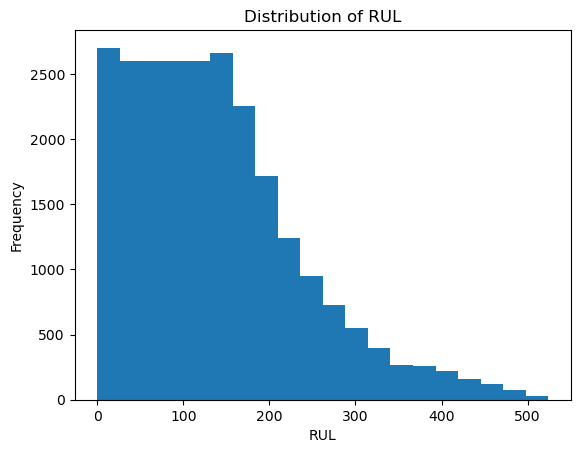

In [25]:
plt.hist(train['RUL'], bins=20)
plt.xlabel('RUL')
plt.ylabel('Frequency')
plt.title('Distribution of RUL')
plt.show()

## Lets look at the data with the standardized variables

C:\Users\Mike Dubois\AppData\Local\Temp\ipykernel_7488\3902760035.py:13: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


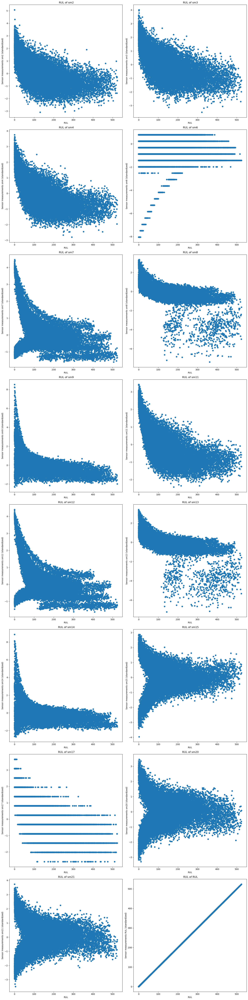

In [26]:
fig, axes = plt.subplots(nrows=8, ncols=2, figsize=(16,64), constrained_layout = True)

cols = train.columns
cols2 = cols[4:20].copy()

for i in range(8):
    for j in range(2):
        ax = axes[i, j]
        ax.set_xlabel('RUL')
        ax.set_ylabel(f'Sensor measurements {cols2[i*2+j]} (standardized)')
        ax.set_title(f' RUL of {cols2[i*2+j]}')
        ax.scatter(train['RUL'],train[cols2[i*2+j]])
        plt.tight_layout()

# Scatterplots without the standardized Data

C:\Users\Mike Dubois\AppData\Local\Temp\ipykernel_7488\3293856906.py:13: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


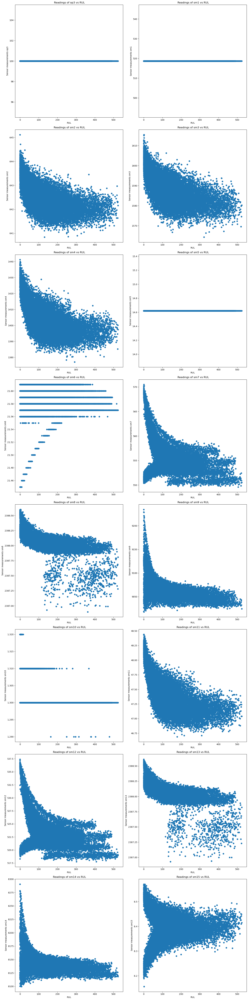

In [27]:
fig, axes = plt.subplots(nrows=8, ncols=2, figsize=(16,64), constrained_layout = True)

cols = train_OG.columns
cols2 = cols[4:20].copy()

for i in range(8):
    for j in range(2):
        ax = axes[i, j]
        ax.set_xlabel('RUL')
        ax.set_ylabel(f'Sensor measurements {cols2[i*2+j]}')
        ax.set_title(f' Readings of {cols2[i*2+j]} vs RUL')
        ax.scatter(train_OG['RUL'],train_OG[cols2[i*2+j]])
        plt.tight_layout()

## Conclusion:
All in all the data is quite telling. We could have done some more feature engineering, but I not sure the data lends itself to needing that. 

There was no indication that standardizing the data was more helpful. 